In [35]:
#Library
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sb
import cv2
from torch.utils.data import Dataset, DataLoader, random_split
import io
from PIL import Image
from sklearn.model_selection import train_test_split
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import time
import os
import copy
from torch.optim.lr_scheduler import ExponentialLR
import multiprocessing as mp
from torch.utils.tensorboard import SummaryWriter
import unittest

In [2]:
#Mounting drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [25]:
#Import and assign train & test images
train_dir= "/content/drive/MyDrive/Paddy Doctor/train_images"
test_dir="/content/drive/MyDrive/Paddy Doctor/test_images"

In [30]:
#Import dataset (metadata)
train_data_path ="/content/drive/MyDrive/Paddy Doctor/train.csv"
train_data = pd.read_csv(train_data_path)
train_data.head()

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45


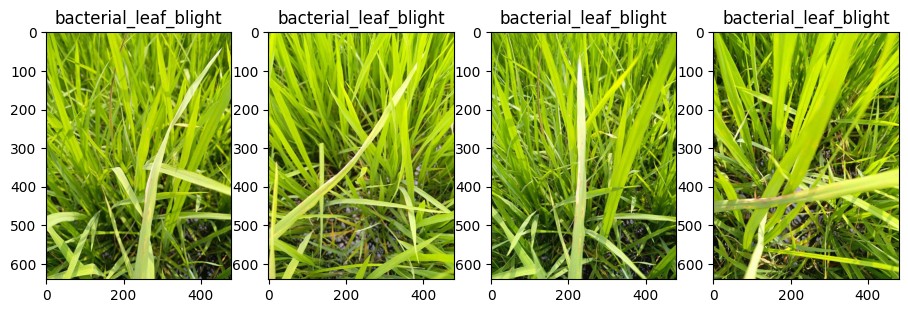

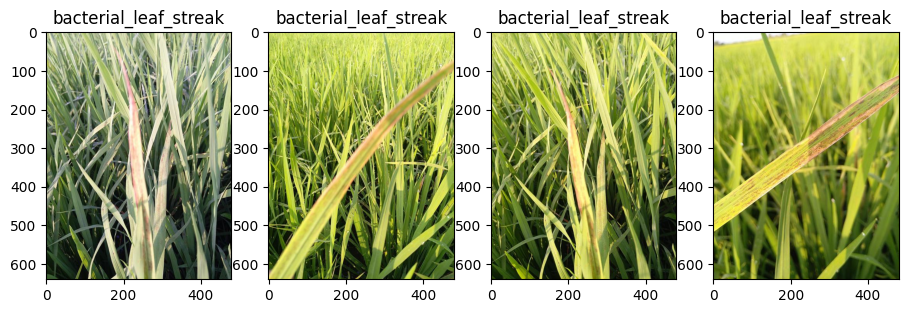

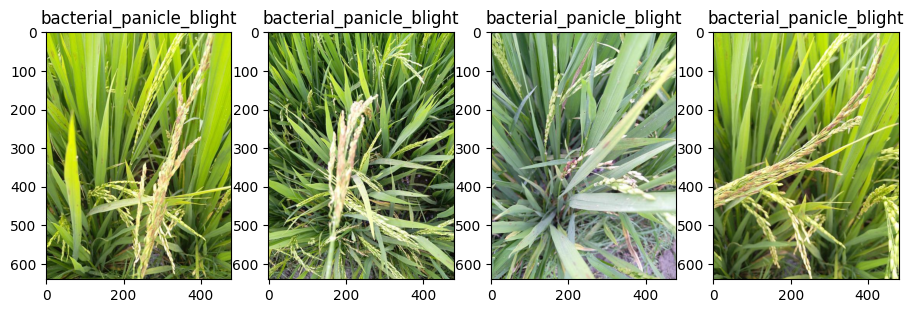

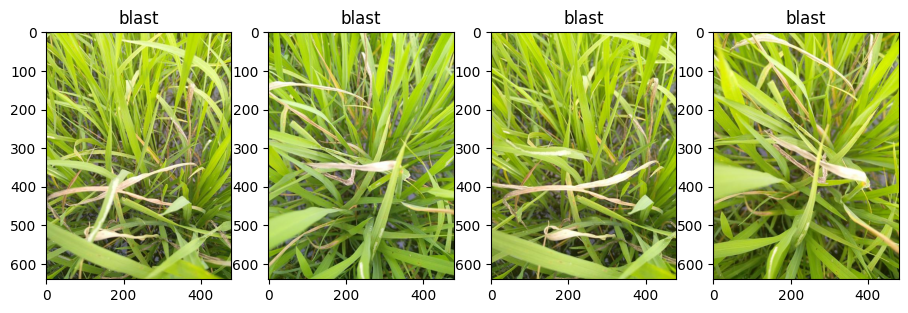

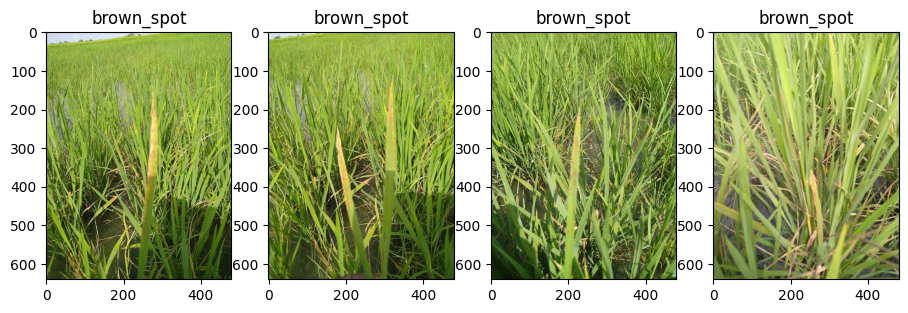

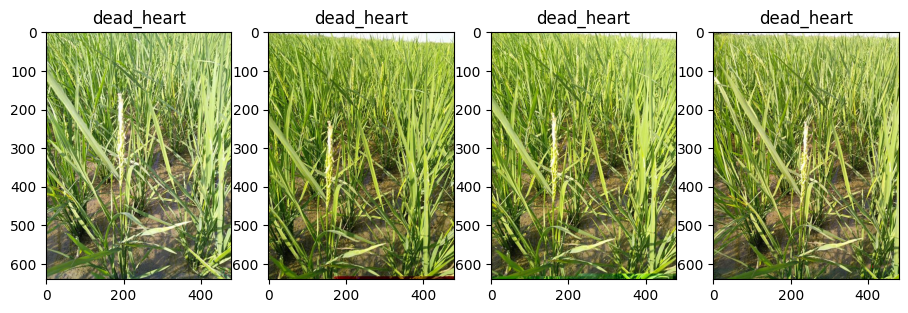

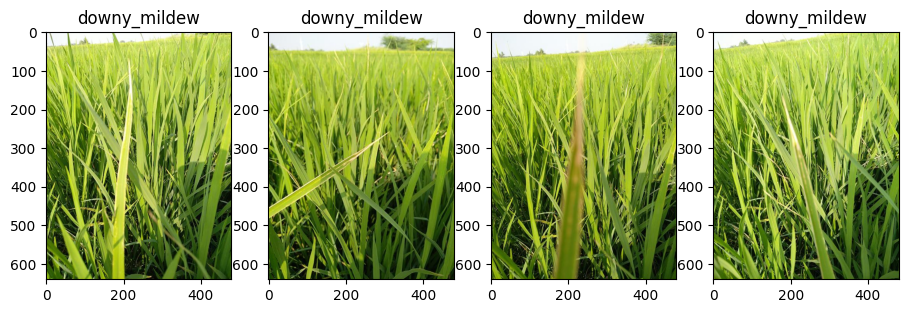

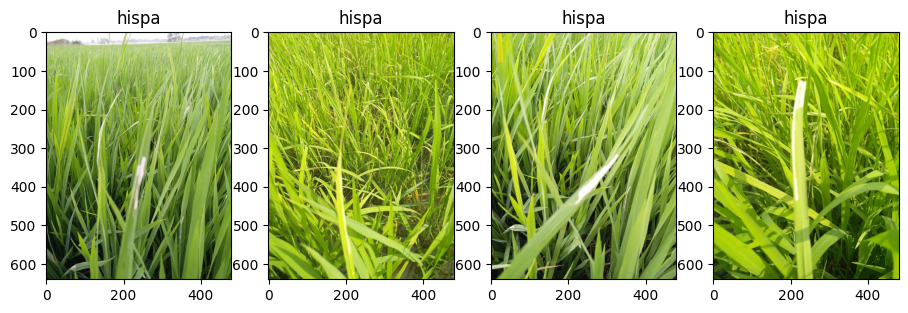

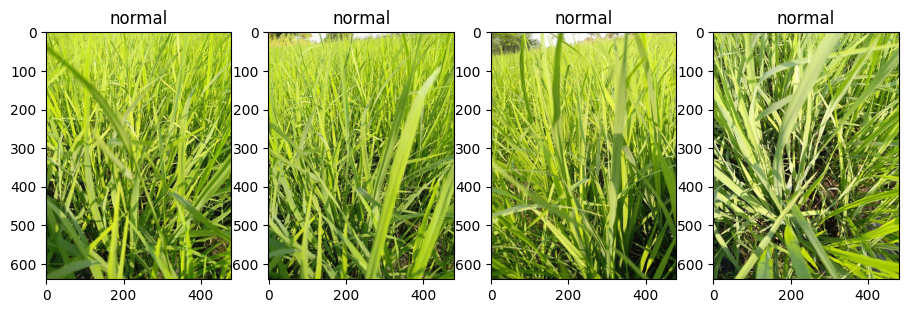

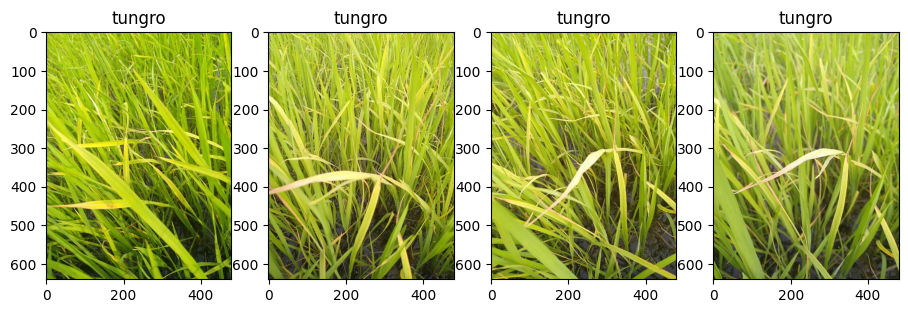

In [5]:
#Visualise four images for each disease

n_cols = 4
disease_groups = train_data.groupby("label")
row_count=1
for name,disease_group in disease_groups:
    index =0
    plot_index = 1
    plt.figure(figsize=(11,100))
    for row_index,row in disease_group.iterrows():
        img_path = os.path.join(train_dir,row.label, row.image_id)
        img = cv2.imread(img_path)
        plt.subplot(4,4,  plot_index)
        plot_index += 1
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{row.label}")
        index += 1
        if index == 4:
            break
    row_count += 1
    plt.show()

In [27]:
#LABELLING CLASSIFICATION
unique_labels = train_data['label'].unique()
label_to_int = {label: idx for idx, label in enumerate(unique_labels)}
print(label_to_int)

{'bacterial_leaf_blight': 0, 'bacterial_leaf_streak': 1, 'bacterial_panicle_blight': 2, 'blast': 3, 'brown_spot': 4, 'dead_heart': 5, 'downy_mildew': 6, 'hispa': 7, 'normal': 8, 'tungro': 9}


In [7]:
#TRANSFORM AND NORMALISATION (Data Augmentation)
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_valid = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


In [8]:
#SUBCLASSING THE DATASET CLASS

class PaddyDataset(Dataset):
    def __init__(self, image_names, labels,  root_dir, transform=None):
        self.image_names = image_names
        self.labels = labels
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.labels.iloc[idx], self.image_names.iloc[idx])
        image = Image.open(img_name)
        label_str = self.labels.iloc[idx]

        # Convert label string to encoded integer
        label = torch.tensor(label_to_int[label_str])


        return image, label

In [9]:
# collate function
def collate_fn_train(batch):
    images = []
    labels = []
    for b in batch:
        # Convert PIL Image to tensor
        image_tensor = transform_train(b[0])
        images.append(image_tensor)
        labels.append(b[1])

    images = torch.stack(images, dim=0)
    labels = torch.stack(labels, dim=0)

    return images, labels

def collate_fn_val(batch):
    images = []
    labels = []
    for b in batch:
        # Check if the input is a PIL Image or a tensor
        image_tensor = transform_valid(b[0])

        images.append(image_tensor)
        labels.append(b[1])

    images = torch.stack(images, dim=0)
    labels = torch.stack(labels, dim=0)

    return images, labels

image_path = train_data['image_id']
labels = train_data['label']

#SPLIT DATASET INTO TRAIN, VAL AND TEST

# Get training indices to split data frames
image_train, image_temp, labels_train, labels_temp = train_test_split(image_path, labels, test_size=0.2, random_state=42)

image_val, image_test, labels_val, labels_test = train_test_split(image_temp, labels_temp, test_size=0.5, random_state=42)


# Create datasets
train_set = PaddyDataset(image_train, labels_train, train_dir)
val_set = PaddyDataset(image_val, labels_val, train_dir)


# Can use a subset of test data for testing
test_set = PaddyDataset(image_test,labels_test, train_dir)


cpu= mp.cpu_count()

# Data loaders
train_loader = DataLoader(train_set, batch_size=64, shuffle=True, num_workers=cpu, collate_fn=collate_fn_train)
val_loader = DataLoader(val_set, batch_size=64, num_workers=cpu, collate_fn=collate_fn_val)
test_loader = DataLoader(test_set, batch_size=64, num_workers=cpu, collate_fn=collate_fn_val)

In [10]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU(inplace=True)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU(inplace=True)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.ReLU(inplace=True)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Calculate the correct input size for the fully connected layers
        input_size = 256 * 28 * 28
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(input_size, 512)
        self.relu4 = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.pool1(x)

        x = self.conv2(x)
        x = self.relu2(x)
        x = self.pool2(x)

        x = self.conv3(x)
        x = self.relu3(x)
        x = self.pool3(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu4(x)
        x = self.fc2(x)

        return x

# Instantiate the model
num_classes = len(unique_labels)
model = SimpleCNN(num_classes)
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

# Print the model architecture
print(model)


SimpleCNN(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU(inplace=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU(inplace=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU(inplace=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=200704, out_features=512, bias=True)
  (relu4): ReLU(inplace=True)
  (fc2): Linear(in_features=512, out_features=10, bias=True)
)


In [11]:
# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Define the learning rate scheduler
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

# Create a SummaryWriter
log_path = '/content/drive/MyDrive/Paddy Doctor/Tensorboard'
writer = SummaryWriter(log_dir=log_path)

# Training loop
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=25, patience=5, checkpoint_frequency=5, checkpoint_path='/content/drive/MyDrive/Paddy Doctor/Checkpoint'):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    early_stop_counter = 0

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.7f}")
        print("-" * 10)

        for phase in ['train', 'val']:
            dataloader = train_loader if phase == 'train' else val_loader
            model.train() if phase == 'train' else model.eval()

            running_loss = 0.0
            running_corrects = 0


            for inputs, labels in dataloader:

                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)

                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                batch_correct = torch.sum(preds == labels.data)
                running_corrects += batch_correct

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)

            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            # Step the learning rate scheduler
            if phase == 'train':
                scheduler.step()

                # Log to TensorBoard
                writer.add_scalar(f'{phase}_loss', epoch_loss, epoch)
                writer.add_scalar(f'{phase}_accuracy', epoch_acc, epoch)

            if phase == 'val':
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    #best_model_wts = copy.deepcopy(model.state_dict())
                    early_stop_counter = 0
                else:
                    early_stop_counter += 1

        # Check for early stopping
        if early_stop_counter >= patience:
            print(f"Early stopping after {patience} epochs of no improvement.")
            break

        # Save model checkpoint
        if epoch % checkpoint_frequency == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_acc': best_acc,
            }, checkpoint_path + f"/v2simplemodel_{epoch}.pt")


    time_elapsed = time.time() - since
    print(f"Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
    print(f"Best Validation Accuracy: {best_acc:.4f}")

    # Load best model weights
    model.load_state_dict(best_model_wts)

    # Close the SummaryWriter
    writer.close()


    return model

# Training the model
num_epochs = 25
patience = 5
checkpoint_frequency = 5  # Save checkpoint every 5 epochs
checkpoint_path = '/content/drive/MyDrive/Paddy Doctor/Checkpoint'
trained_model = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs, patience, checkpoint_frequency, checkpoint_path)



Epoch 1/25
Learning Rate: 0.0010000
----------
Train Loss: 2.4373 Acc: 0.2185
Val Loss: 1.8842 Acc: 0.3333
Epoch 2/25
Learning Rate: 0.0009500
----------
Train Loss: 1.9403 Acc: 0.3166
Val Loss: 1.8637 Acc: 0.3612
Epoch 3/25
Learning Rate: 0.0009025
----------
Train Loss: 1.8661 Acc: 0.3566
Val Loss: 1.7490 Acc: 0.3939
Epoch 4/25
Learning Rate: 0.0008574
----------
Train Loss: 1.7946 Acc: 0.3765
Val Loss: 1.6382 Acc: 0.4323
Epoch 5/25
Learning Rate: 0.0008145
----------
Train Loss: 1.6822 Acc: 0.4094
Val Loss: 1.5323 Acc: 0.4899
Epoch 6/25
Learning Rate: 0.0007738
----------
Train Loss: 1.5871 Acc: 0.4448
Val Loss: 1.3190 Acc: 0.5572
Epoch 7/25
Learning Rate: 0.0007351
----------
Train Loss: 1.5132 Acc: 0.4796
Val Loss: 1.2902 Acc: 0.5514
Epoch 8/25
Learning Rate: 0.0006983
----------
Train Loss: 1.4399 Acc: 0.4985
Val Loss: 1.2434 Acc: 0.5898
Epoch 9/25
Learning Rate: 0.0006634
----------
Train Loss: 1.3742 Acc: 0.5303
Val Loss: 1.1800 Acc: 0.5879
Epoch 10/25
Learning Rate: 0.0006302


In [12]:
#testing loop
def test_model(model, test_loader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        with torch.no_grad():
            outputs = model(inputs)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        batch_correct = torch.sum(preds == labels.data)
        running_corrects += batch_correct

    test_loss = running_loss / len(test_loader.dataset)
    test_acc = running_corrects.double() / len(test_loader.dataset)

    print(f"Test Loss: {test_loss:.4f} Acc: {test_acc:.4f}")

# Load the best model from the saved checkpoint
checkpoint_path = '/content/drive/MyDrive/Paddy Doctor/Checkpoint/v2simplemodel_20.pt'  # Adjust the path based on your saved checkpoints
checkpoint = torch.load(checkpoint_path)
new_model = SimpleCNN(10)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
new_model.to(device)
new_model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded model with best validation accuracy: {checkpoint['best_acc']:.4f}")

# Test the model
test_model(new_model, test_loader, criterion)



Loaded model with best validation accuracy: 0.8012
Test Loss: 0.5170 Acc: 0.8357


In [13]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Paddy\ Doctor/Tensorboard

<IPython.core.display.Javascript object>

In [36]:
#Unit test
class TestDataLoading(unittest.TestCase):

    def setUp(self):
        data = {'image_id': ['100330.jpg', '107811.jpg'],
                'label': ['bacterial_leaf_blight', 'tungro']}
        sample_data = pd.DataFrame(data)
        self.sample_images = sample_data['image_id']
        self.sample_labels = sample_data['label']
        self.dataset = PaddyDataset(self.sample_images, self.sample_labels, train_dir, transform=transform_train)

    def test_image_loading(self):
        image, label = self.dataset[0]
        self.assertIsInstance(image, torch.Tensor)
        self.assertEqual(image.shape, (3, 224, 224))

    def test_label_assignment(self):
        _, label = self.dataset[0]
        self.assertIn(label, range(len(unique_labels)))


class TestModel(unittest.TestCase):

    def setUp(self):
        self.model = SimpleCNN(num_classes=len(unique_labels)).float()

    def test_model_output(self):
        sample_input = torch.randn(1, 3, 224, 224).float()  # Batch size 1, 3 color channels, 224x224 image
        output = self.model(sample_input)
        self.assertEqual(output.shape, (1, len(unique_labels)))  # Output size should match number of classes

class TestTraining(unittest.TestCase):

    def test_training_loop(self):
        try:
            train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=1)
        except Exception as e:
            self.fail(f"Training loop failed with exception {e}")

if __name__ == '__main__':
    unittest.main(argv=[''], exit=False)

F...F.EE

Epoch 1/1
Learning Rate: 0.0001840
----------
Train Loss: 2.0258 Acc: 0.2855
Val Loss: 1.7343 Acc: 0.4159


.
ERROR: test_testing_loop (__main__.TestPaddyDoctorModel)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "<ipython-input-16-e585640d327c>", line 62, in test_testing_loop
    outputs = self.sample_model(inputs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "<ipython-input-16-e585640d327c>", line 20, in forward
    x = self.fc(x)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return forward_call(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/

Training complete in 0m 45s
Best Validation Accuracy: 0.4159
